Modified based on tutorial https://landlab.readthedocs.io/en/latest/tutorials/fault_scarp/landlab-fault-scarp.html

Code to test the effect of noise renewal on measured scarp degradation

Author: Alba M. Rodriguez Padilla

In [1]:
%load_ext autoreload
%autoreload 2

import utils
import numpy as np
import matplotlib.pyplot as plt
from landlab import RasterModelGrid
from landlab.plot.imshow import imshow_grid

/opt/homebrew/anaconda3/envs/scarp_erosion/lib/python3.12/site-packages/landlab/graph/graph.py:412: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  return self.ds.dims["node"]
/opt/homebrew/anaconda3/envs/scarp_erosion/lib/python3.12/site-packages/landlab/graph/graph.py:535: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  return self.ds.dims["link"]
/opt/homebrew/anaconda3/envs/scarp_erosion/lib/python3.12/site-packages/landlab/graph/graph.py:984: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `

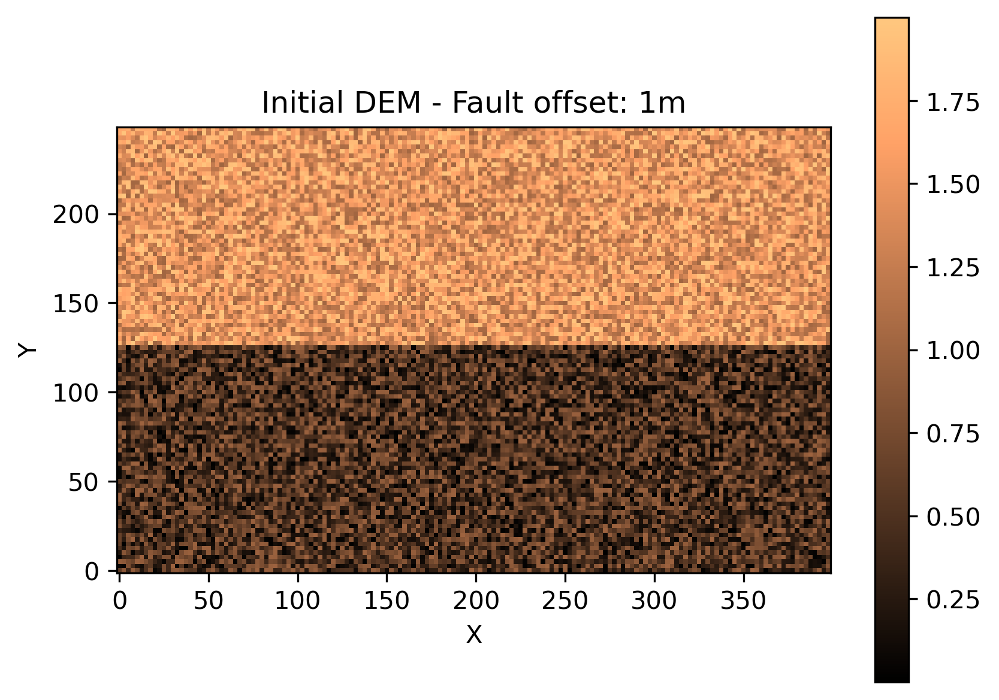

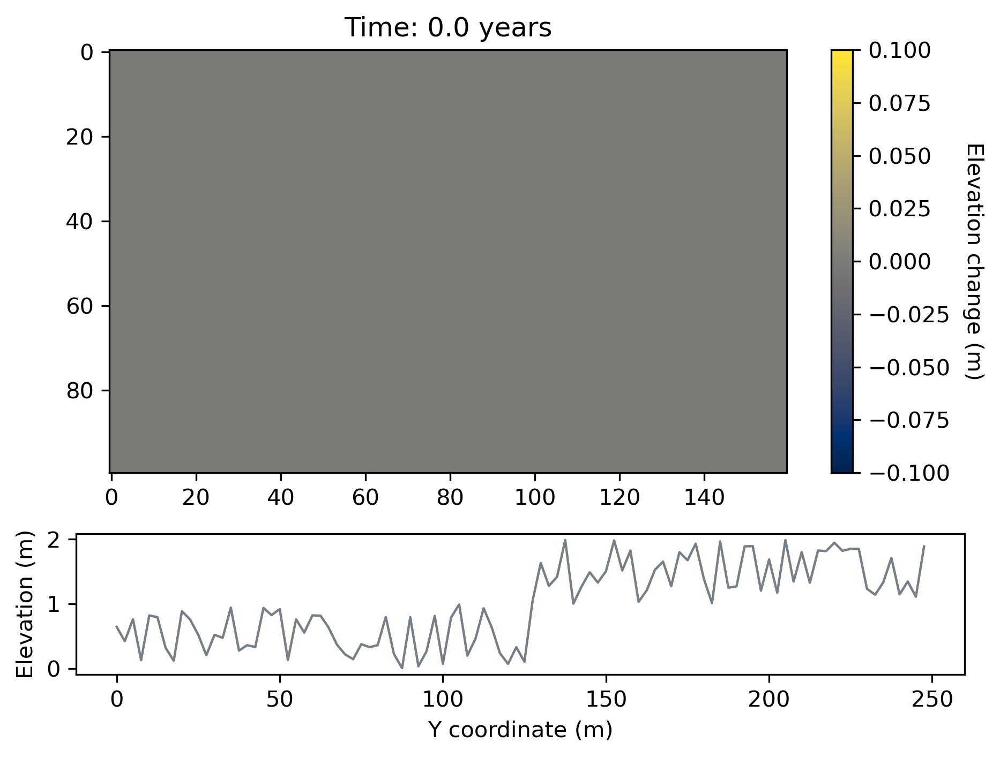

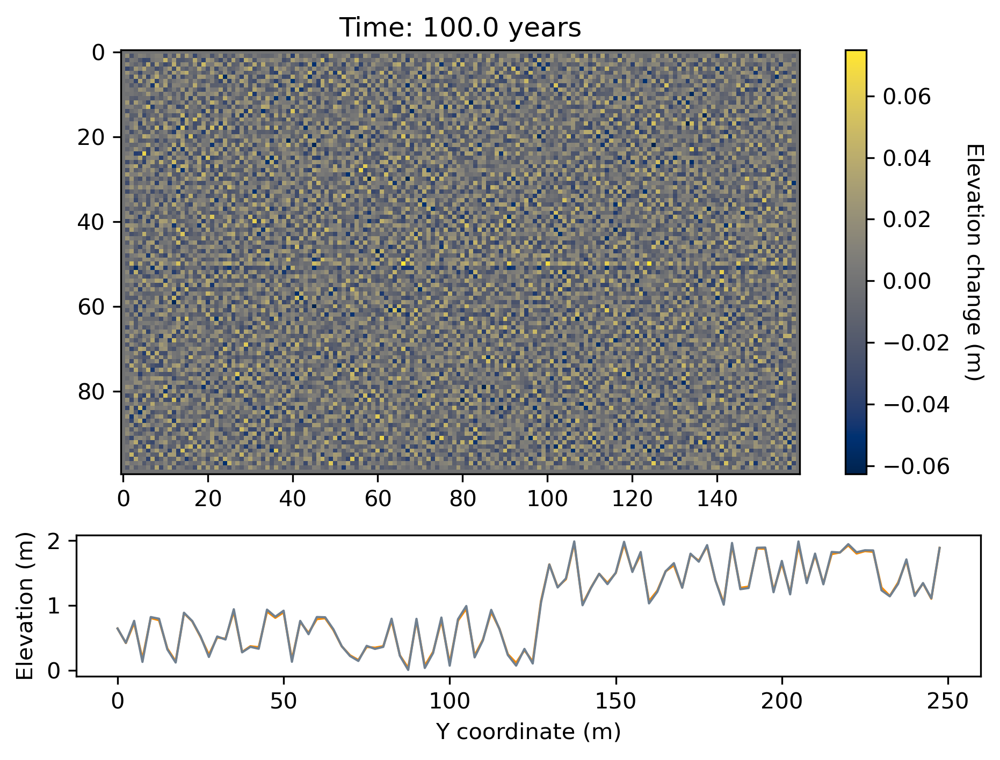

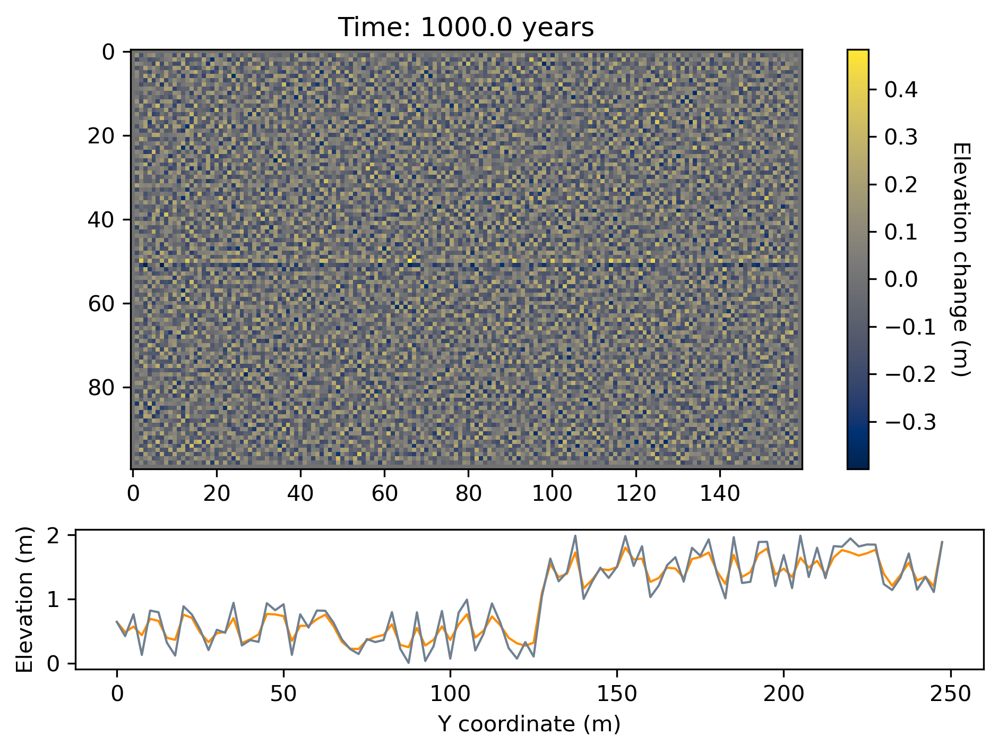

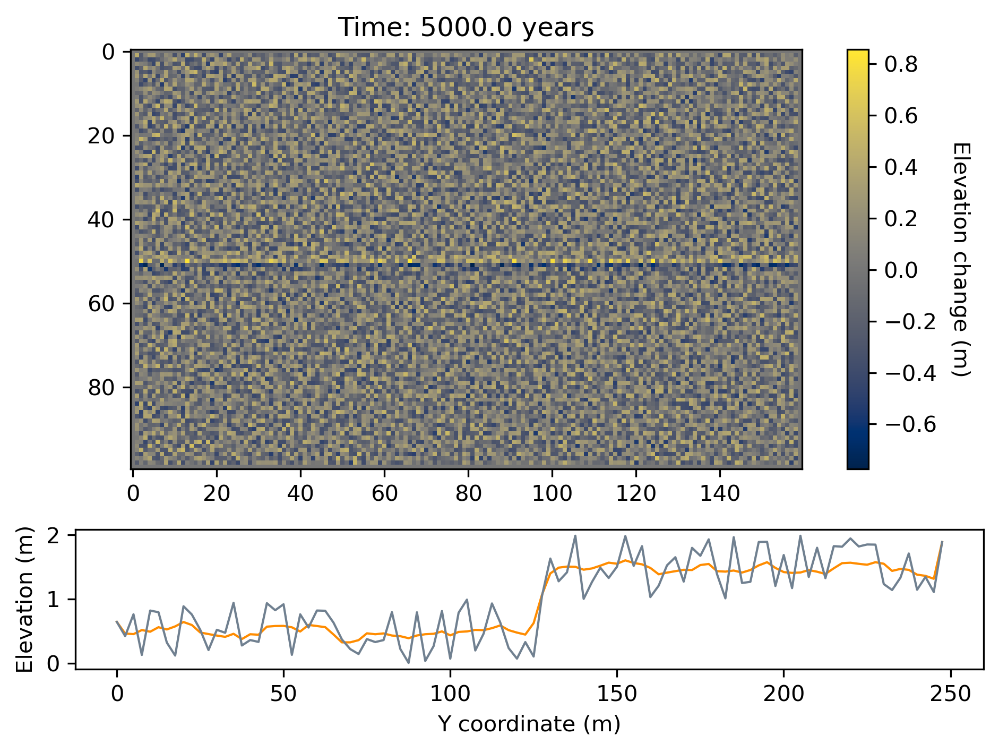

...

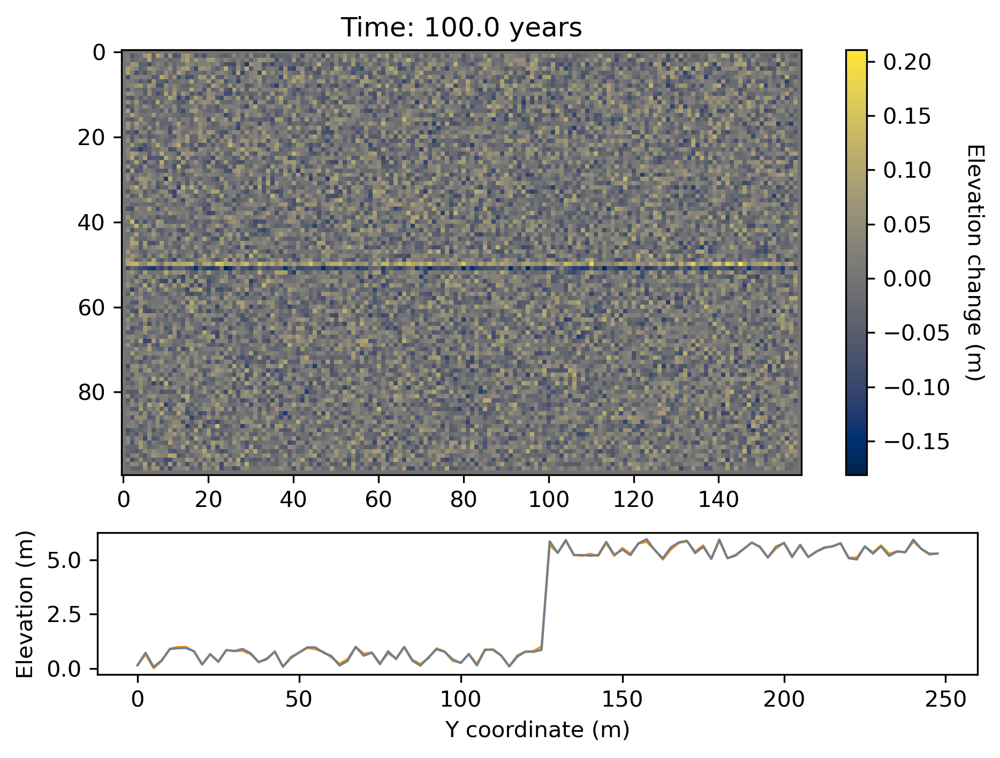

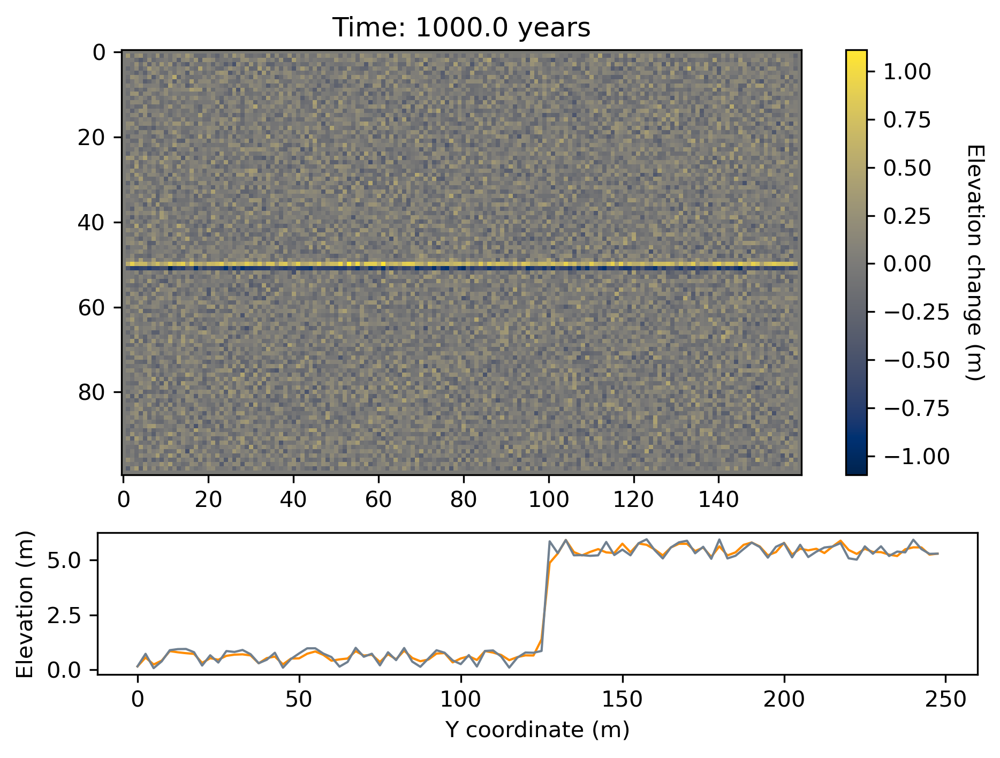

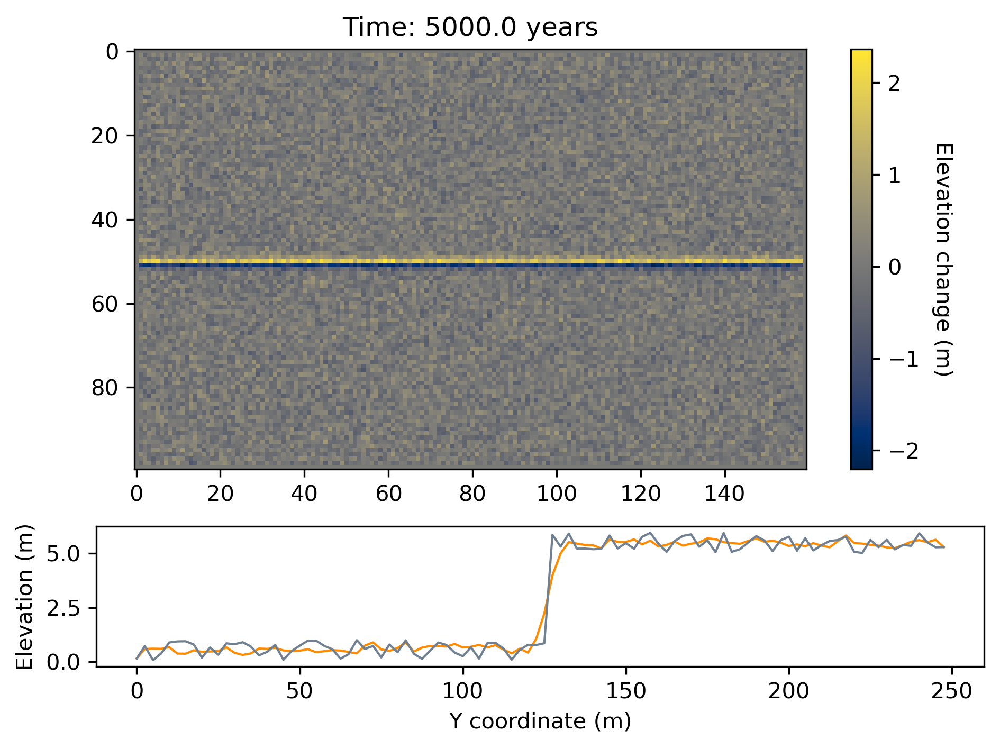

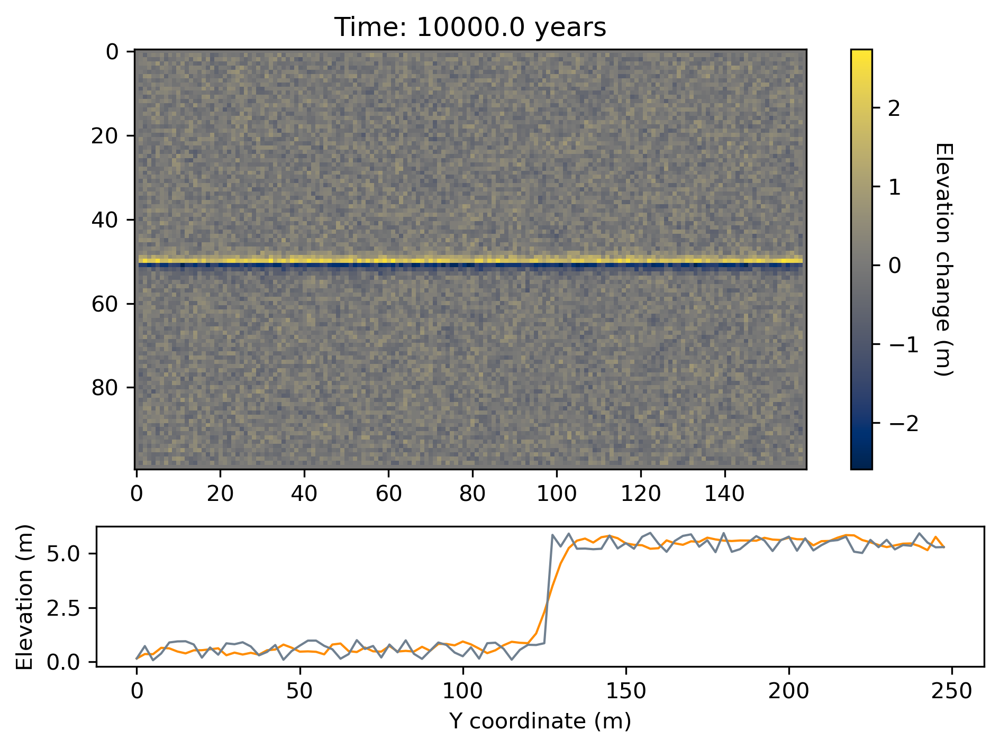

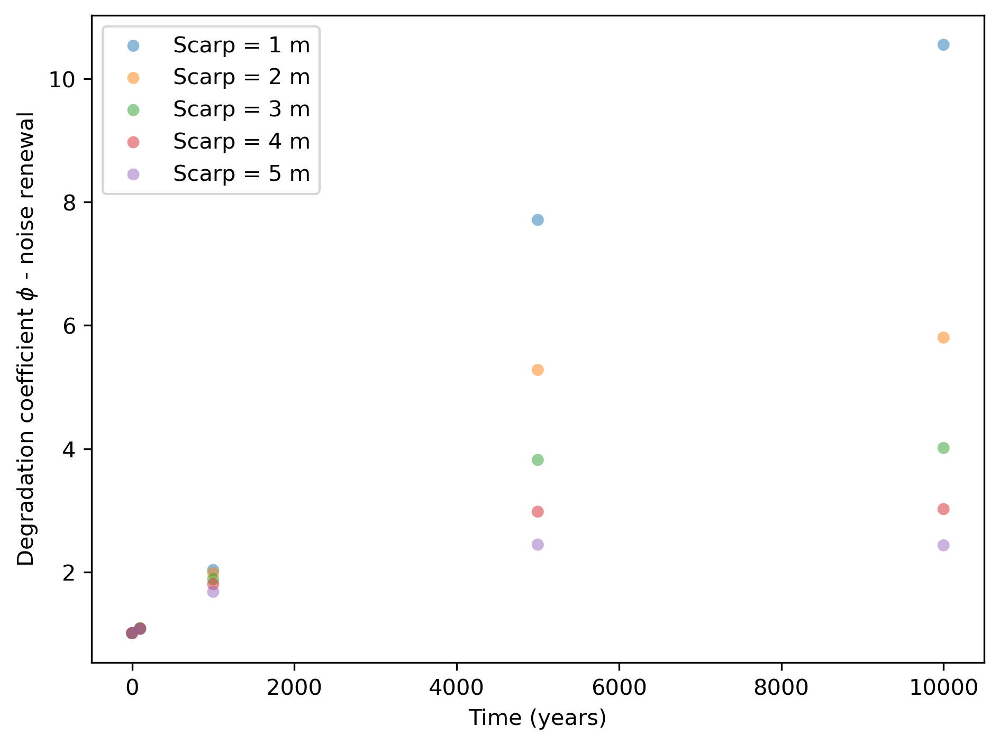

In [2]:
fault_offsets = [1, 2, 3, 4, 5]
coeffs = [[] for _ in fault_offsets]

for fault_idx, fault_offset in enumerate(fault_offsets):
    mg = RasterModelGrid((100, 160), 2.5)
    z = np.random.rand(mg.size("node"))  # random noise for initial topo
    mg.add_field("topographic__elevation", z, at="node")

    fault_trace_y = 125.0  # midpoint y
    z[mg.y_of_node > fault_trace_y] += fault_offset
    z_t0 = z[mg.nodes]
    slope_t0 = mg.calc_slope_at_node(z)
    slope_t0 = np.array(slope_t0)

    plt.figure(dpi=300)
    imshow_grid(mg, "topographic__elevation", cmap="copper")
    plt.title(f"Initial DEM - Fault offset: {fault_offset}m")

    D = 0.001  # m2/yr transport coefficient
    dt = 0.2 * 0.5 * 0.5 / D  # default time step is 50 years
    mg.set_closed_boundaries_at_grid_edges(True, True, True, True)
    qs = mg.add_zeros("sediment_flux", at="link")
    n_iter = np.array([0, 2, 20, 100, 200])

    x_idx = 80  # midpoint x
    z0_profile = z_t0.reshape(mg.shape)[:, x_idx]

    plot_counter = 0
    years = []
    coeff = []

    ######  noise definition here - amplitude defined as function of fault offset
    noise_amplitude = fault_offset * 0.01  # 1% of fault offset

    for p in range(max(n_iter) + 1):
        if np.any(p == n_iter):
            slope_t = mg.calc_slope_at_node(z)
            slope_t = np.array(slope_t)
            coeffs[fault_idx].append(
                utils.estimate_degradation_coefficient_noplot(slope_t0, slope_t)
            )
            z_t = z[mg.nodes]
            years.append(p * dt)

            fig = plt.figure(dpi=300)
            gs = fig.add_gridspec(2, 1, height_ratios=[3, 1])

            ax1 = fig.add_subplot(gs[0])
            im = ax1.imshow(np.array(z_t) - np.array(z_t0), cmap="cividis")
            cbar = plt.colorbar(im, ax=ax1)
            cbar.set_label("Elevation change (m)", rotation=270, labelpad=15)
            ax1.set_title(f"Time: {p*dt} years")

            ax2 = fig.add_subplot(gs[1])
            y_coords = mg.y_of_node.reshape(mg.shape)[:, 0]
            z_profile = z_t.reshape(mg.shape)[:, x_idx]

            ax2.plot(y_coords, z_profile, "darkorange", lw=1)
            ax2.plot(y_coords, z0_profile, "slategray", lw=1)
            ax2.set_xlabel("Y coordinate (m)")
            ax2.set_ylabel("Elevation (m)")

            plt.tight_layout()

        g = mg.calc_grad_at_link(z)
        qs[mg.active_links] = -D * g[mg.active_links]
        dzdt = -mg.calc_flux_div_at_node(qs)

        # add random noise at each timestep
        z[mg.core_nodes] += (
            dzdt[mg.core_nodes] * dt
            + (np.random.rand(len(mg.core_nodes)) - 0.5) * 2 * noise_amplitude
        )

#  degradation coefficients over time for each fault offset
plt.figure(dpi=300)
for i, fault_offset in enumerate(fault_offsets):
    plt.scatter(
        n_iter * dt,
        coeffs[i],
        s=30,
        alpha=0.5,
        edgecolor="none",
        label=f"Scarp = {fault_offset} m",
    )
plt.xlabel("Time (years)")
plt.ylabel(r"Degradation coefficient $\phi$ - noise renewal")
plt.legend()
plt.tight_layout()

/var/folders/kg/j5ms0y1x28l_gm2jtsf5j4pr0000gn/T/ipykernel_51190/3242584452.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10, 8))


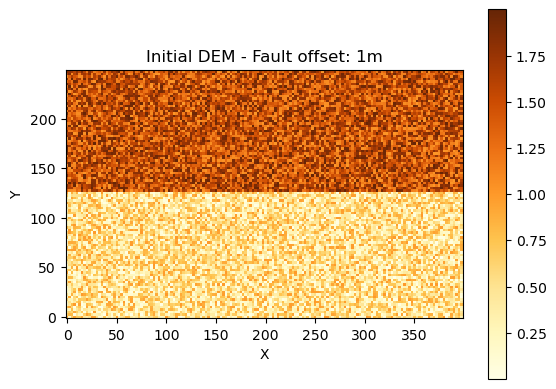

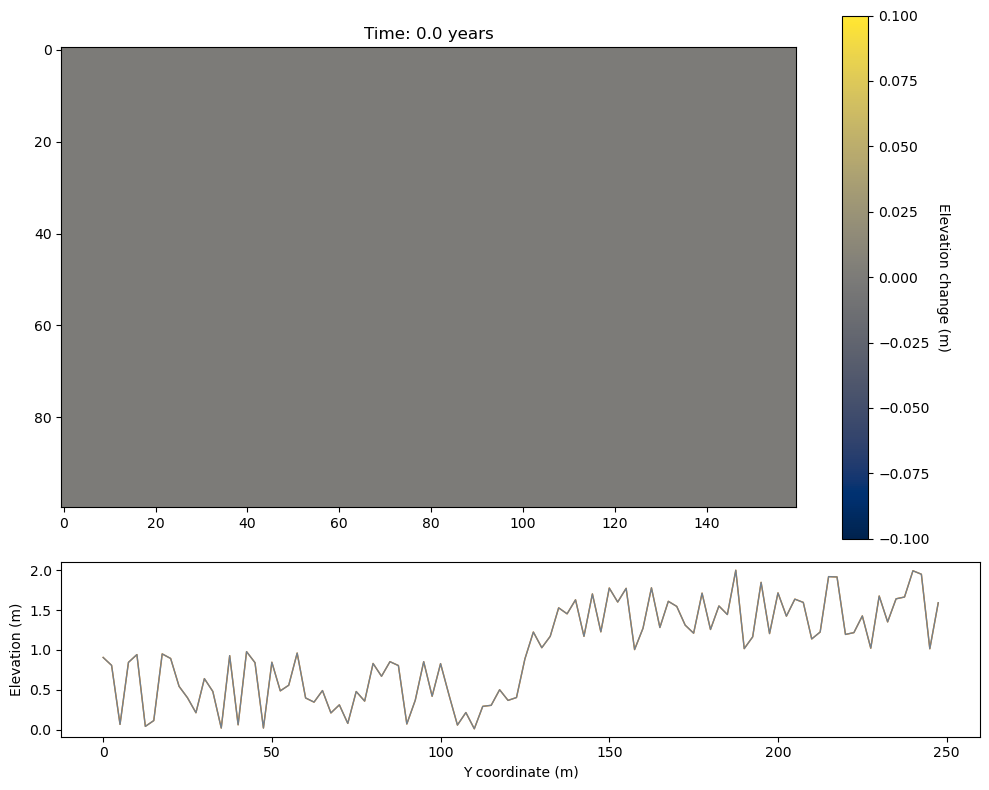

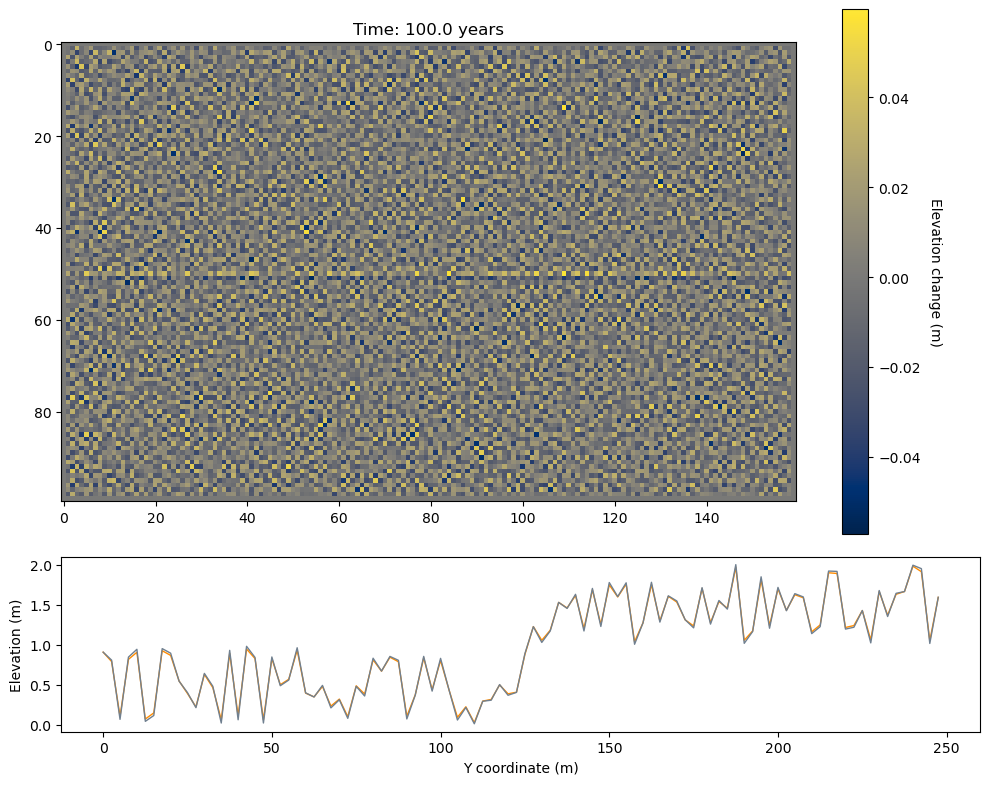

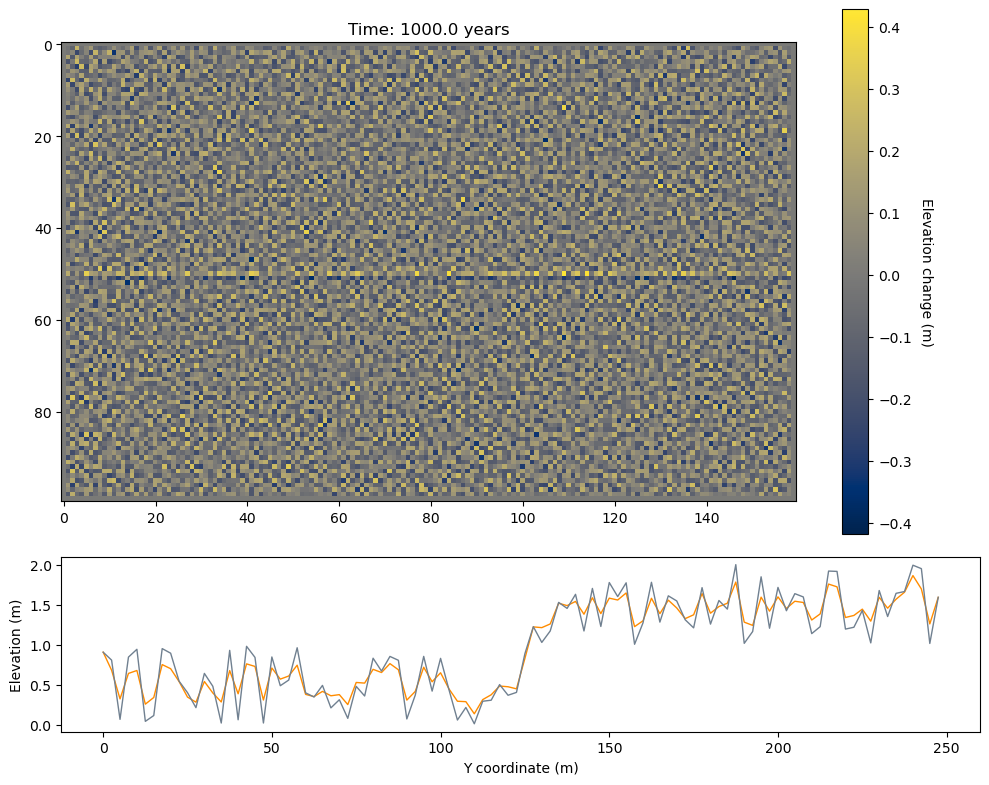

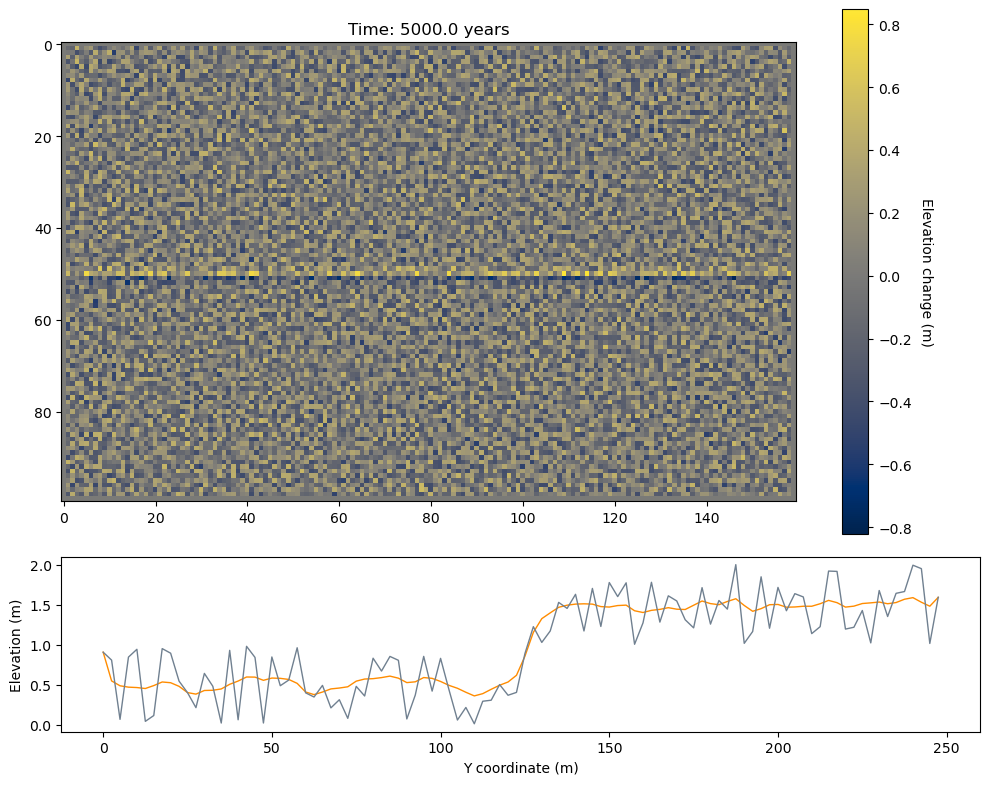

...

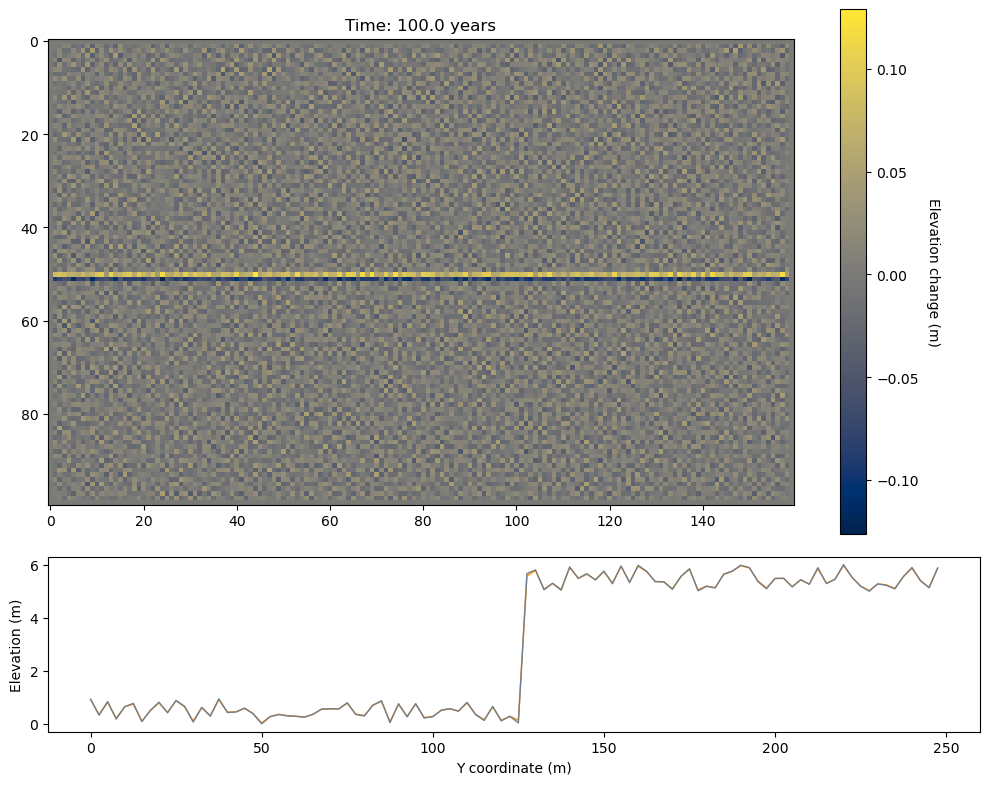

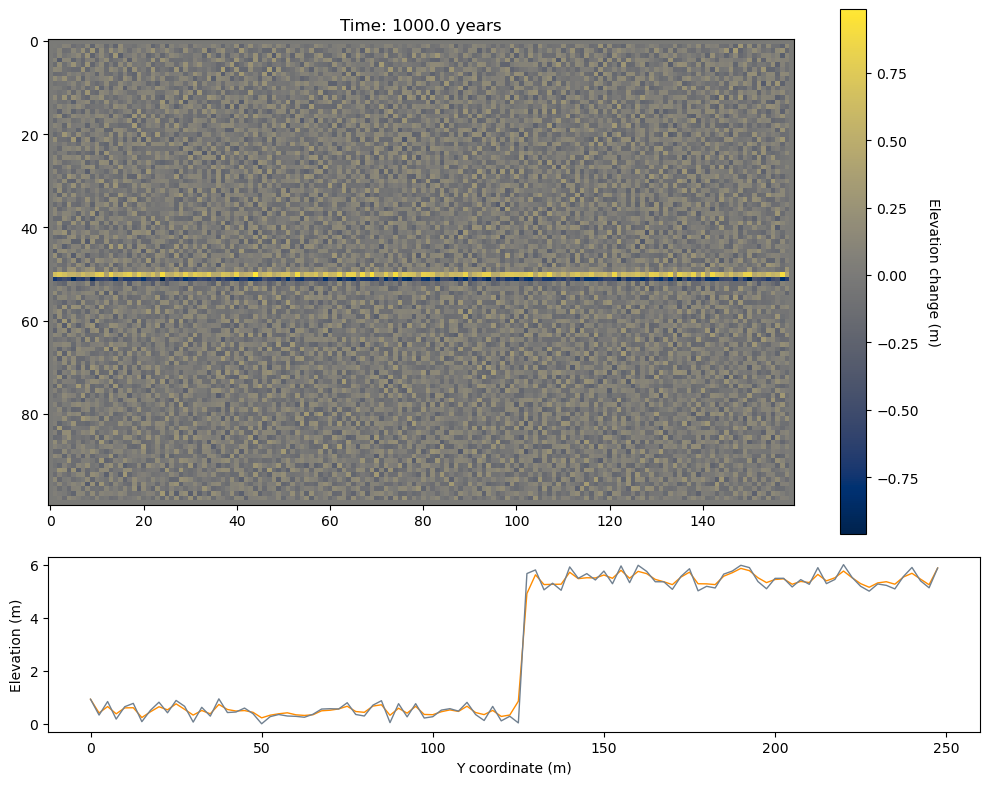

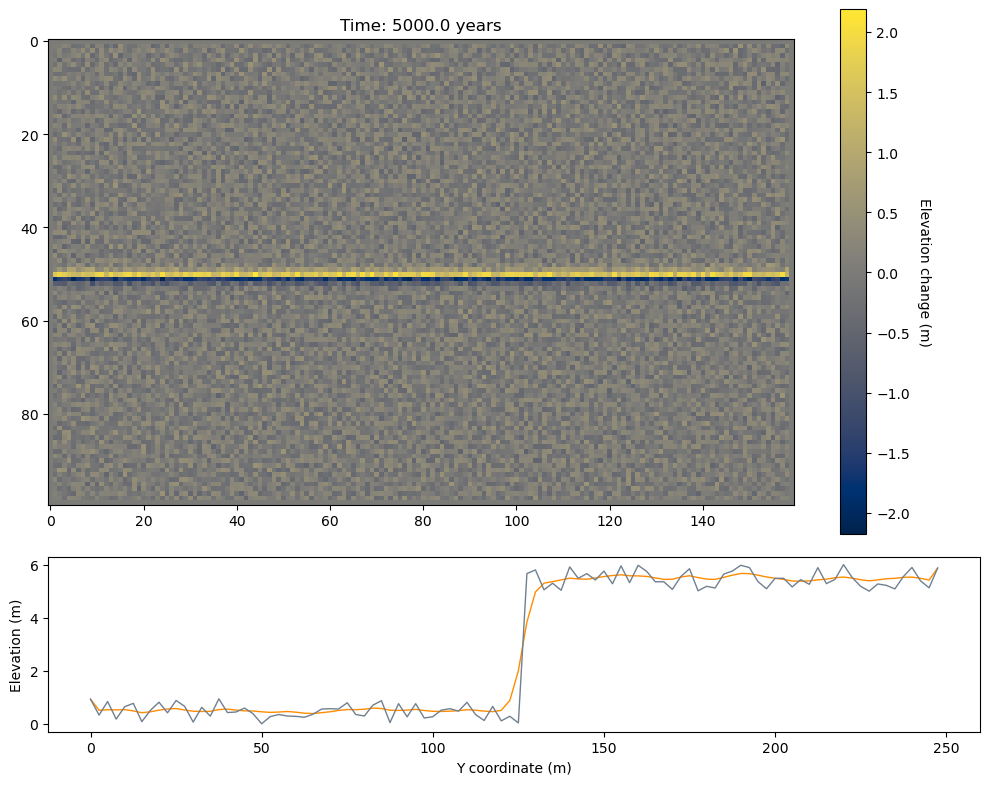

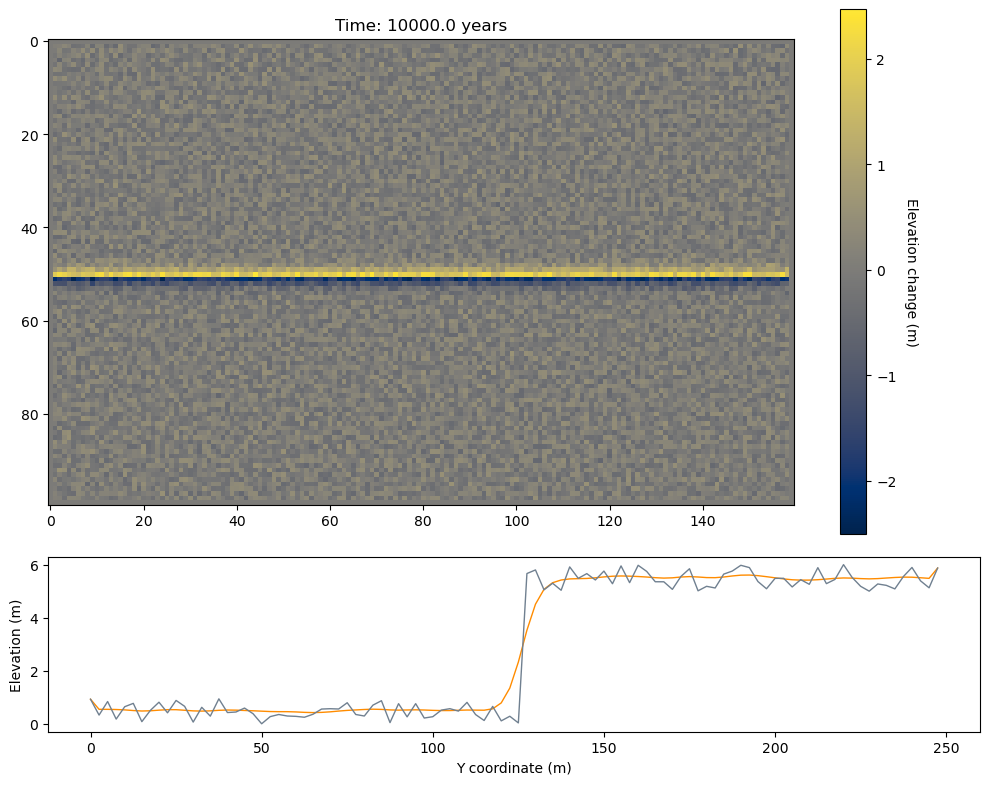

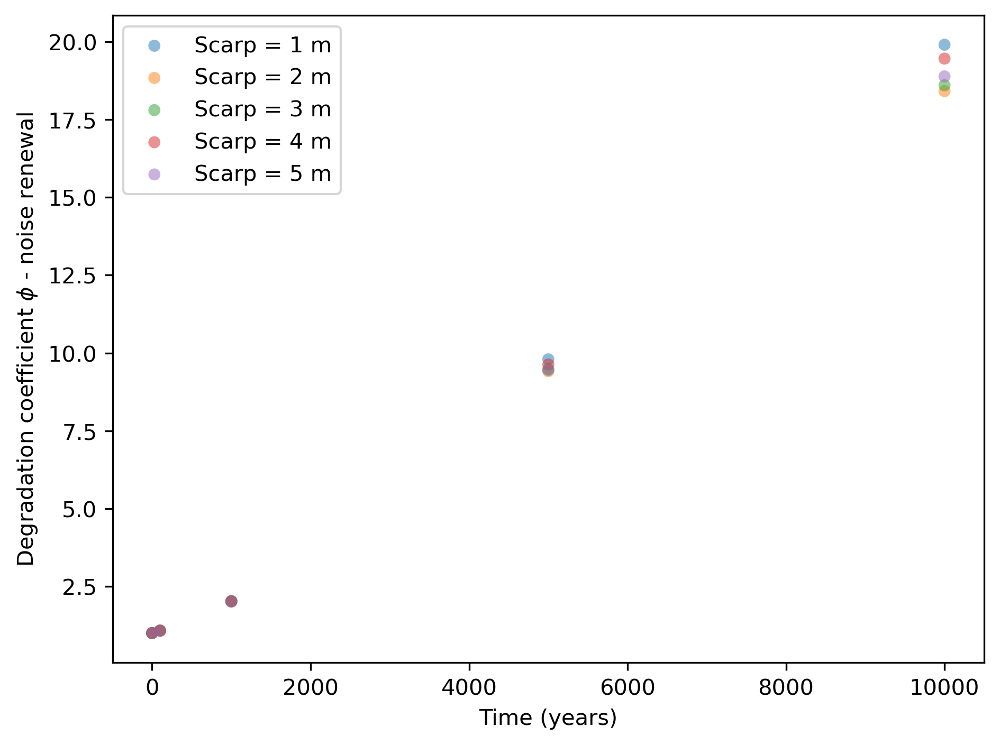

In [3]:
fault_offsets = [1,2,3,4,5]
coeffs = [[] for _ in fault_offsets]

for fault_idx, fault_offset in enumerate(fault_offsets):  
    mg = RasterModelGrid((100, 160), 2.5)
    z = np.random.rand(mg.size("node"))  # random noise for initial topography only
    mg.add_field("topographic__elevation", z, at="node")

    fault_trace_y = 125.0  # Middle of y-extent
    z[mg.y_of_node > fault_trace_y] += fault_offset
    z_t0 = z[mg.nodes]
    slope_t0 = mg.calc_slope_at_node(z)
    slope_t0 = np.array(slope_t0)
    
    # plot initial DEM
    plt.figure()
    imshow_grid(mg, "topographic__elevation", cmap='YlOrBr')
    plt.title(f'Initial DEM - Fault offset: {fault_offset}m')
    
    D = 0.001  # m2/yr transport coefficient
    dt = 0.2 * 0.5 * 0.5 / D # default time step is 50 years 
    mg.set_closed_boundaries_at_grid_edges(True, True, True, True)
    qs = mg.add_zeros("sediment_flux", at="link")
    n_iter = np.array([0, 2, 20, 100, 200])

    # Define x_idx before using it
    x_idx = 80  # Middle of the grid
    z0_profile = z_t0.reshape(mg.shape)[:, x_idx]
    
    plot_counter = 0
    years = []
    coeff = []
    
    for p in range(max(n_iter)+1):
        if np.any(p == n_iter):
            slope_t = mg.calc_slope_at_node(z)
            slope_t = np.array(slope_t)
            coeffs[fault_idx].append(utils.estimate_degradation_coefficient_noplot(slope_t0,slope_t))
            z_t = z[mg.nodes]
            years.append(p*dt)
            
            # Create figure with custom subplot sizes
            fig = plt.figure(figsize=(10, 8))
            gs = fig.add_gridspec(2, 1, height_ratios=[3, 1])
            
            # Plot DEM changes on top (larger)
            ax1 = fig.add_subplot(gs[0])
            im = ax1.imshow(np.array(z_t)-np.array(z_t0), cmap='cividis')
            cbar = plt.colorbar(im, ax=ax1)
            cbar.set_label('Elevation change (m)', rotation=270, labelpad=15)
            ax1.set_title(f'Time: {p*dt} years')
            
            # Plot elevation cross-section on bottom (smaller)
            ax2 = fig.add_subplot(gs[1])
            y_coords = mg.y_of_node.reshape(mg.shape)[:,0]
            z_profile = z_t.reshape(mg.shape)[:, x_idx]
            
            ax2.plot(y_coords, z_profile, 'darkorange', lw=1)
            ax2.plot(y_coords, z0_profile, 'slategray', lw=1)
            ax2.set_xlabel('Y coordinate (m)')
            ax2.set_ylabel('Elevation (m)')
            
            plt.tight_layout()
            
        g = mg.calc_grad_at_link(z)
        qs[mg.active_links] = -D * g[mg.active_links]
        dzdt = -mg.calc_flux_div_at_node(qs)
        z[mg.core_nodes] += dzdt[mg.core_nodes] * dt  # Pure diffusion, no noise added

# Plot degradation coefficients over time for each fault offset
plt.figure(dpi=300)
for i, fault_offset in enumerate(fault_offsets):
    plt.scatter(n_iter * dt, coeffs[i], s=30, alpha=0.5, edgecolor='none', label=f'Scarp = {fault_offset} m')
plt.xlabel('Time (years)')
plt.ylabel(r'Degradation coefficient $\phi$ - noise renewal')
plt.legend()
plt.tight_layout()

/var/folders/kg/j5ms0y1x28l_gm2jtsf5j4pr0000gn/T/ipykernel_51190/2616696142.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(dpi=300,figsize=(6,2))


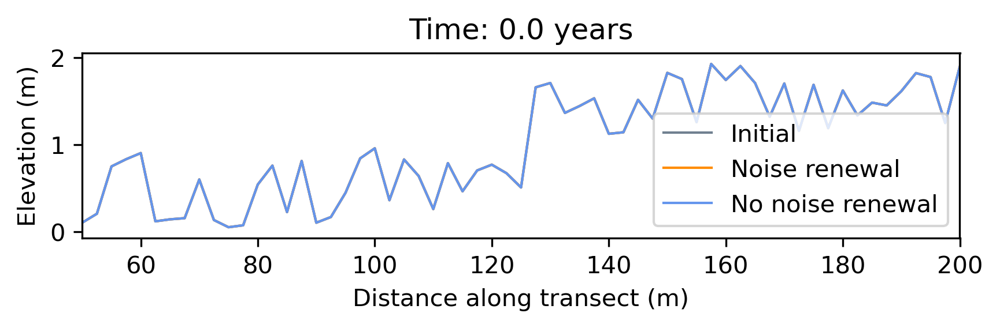

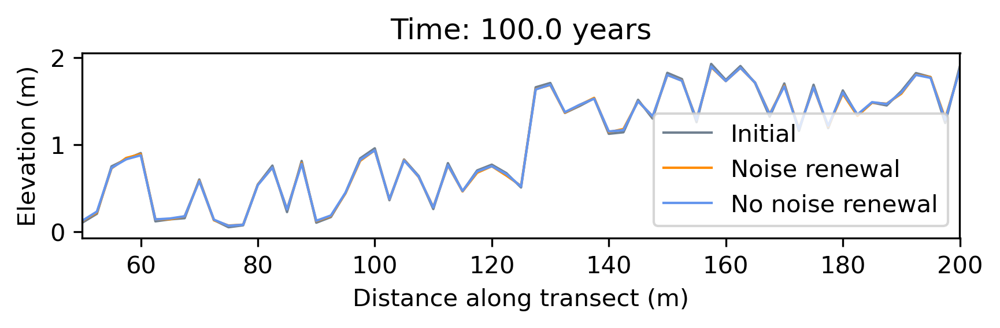

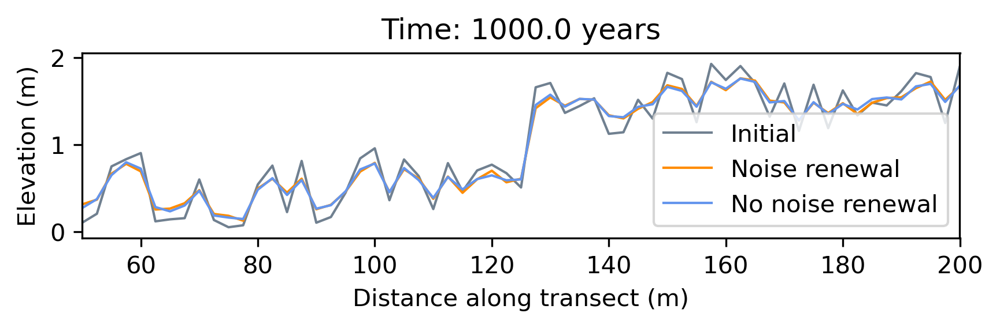

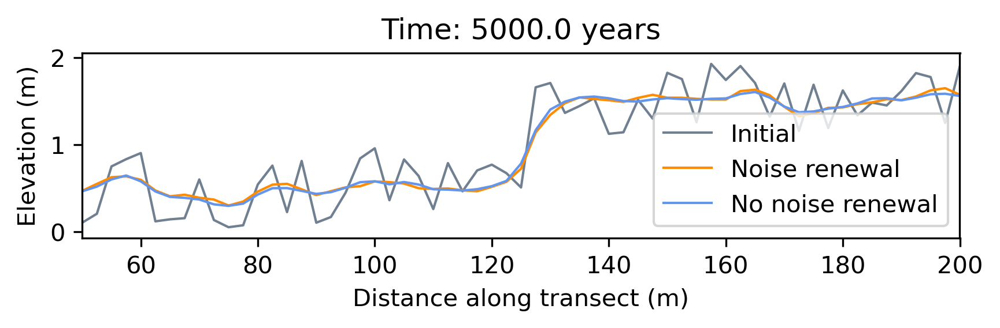

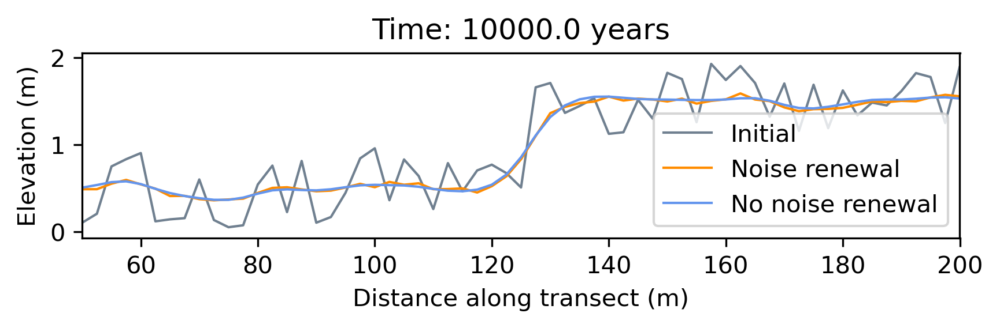

...

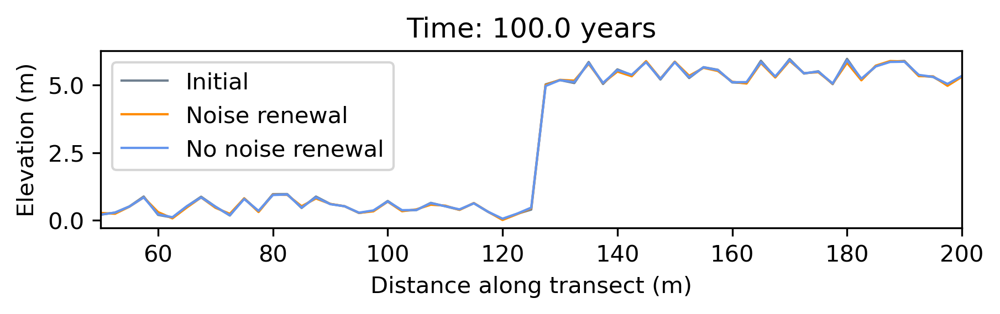

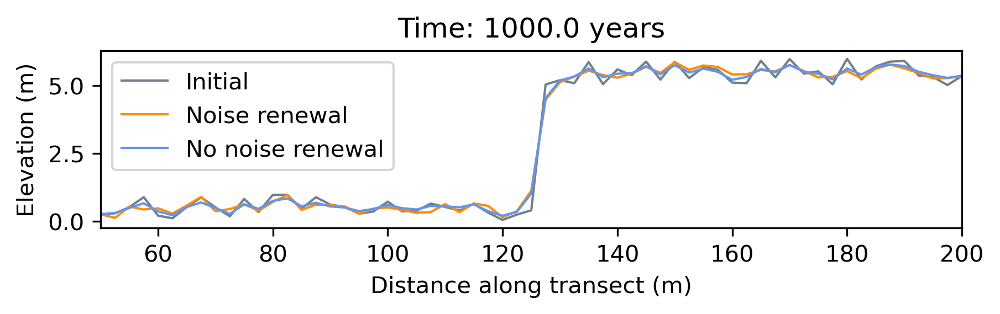

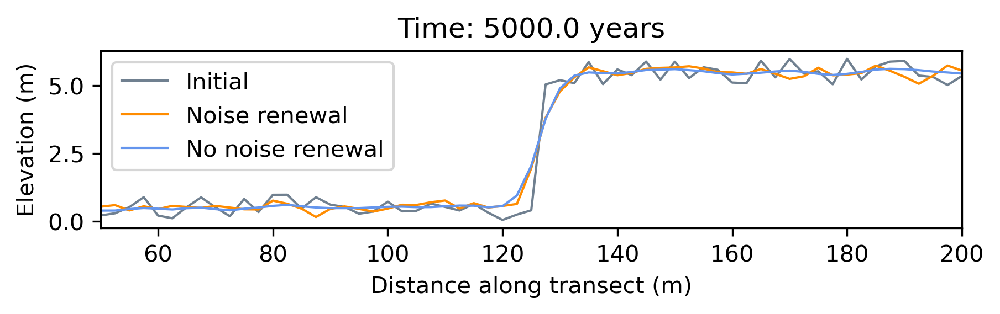

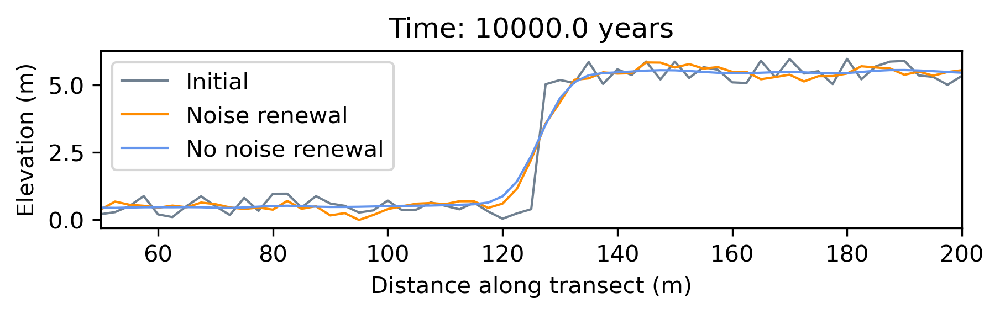

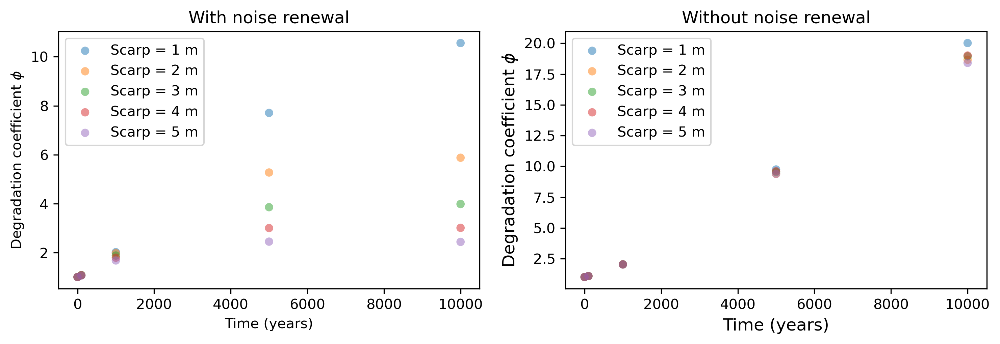

In [ ]:
fault_offsets = [1,2,3,4,5]
coeffs_noise = [[] for _ in fault_offsets]      # For noise renewal case
coeffs_no_noise = [[] for _ in fault_offsets]   # For no noise case

for fault_idx, fault_offset in enumerate(fault_offsets):  
    # Create grid and initialize elevation
    mg = RasterModelGrid((100, 160), 2.5)
    z = np.random.rand(mg.size("node"))  # random noise for initial topography
    mg.add_field("topographic__elevation", z, at="node")

    fault_trace_y = 125.0  # Middle of y-extent
    z[mg.y_of_node > fault_trace_y] += fault_offset
    z_t0 = z.copy()  # Store initial condition
    mg.at_node["topographic__elevation"][:] = z_t0.flatten()
    slope_t0 = mg.calc_slope_at_node(z)
    slope_t0 = np.array(slope_t0)
    
    D = 0.001  # m2/yr transport coefficient
    dt = 0.2 * 0.5 * 0.5 / D # default time step is 50 years 
    mg.set_closed_boundaries_at_grid_edges(True, True, True, True)
    qs = mg.add_zeros("sediment_flux", at="link")
    n_iter = np.array([0, 2, 20, 100, 200])

    x_idx = 80  # Middle of the grid
    z0_profile = z_t0.reshape(mg.shape)[:, x_idx]
    years = []
    
    # Initialize both cases with same starting condition
    z_noise = z_t0.copy()
    z_no_noise = z_t0.copy()
    noise_amplitude = fault_offset * 0.01  # 1% of fault offset
    
    for p in range(max(n_iter)+1):
        if np.any(p == n_iter):
            # Calculate coefficients for noise case
            mg.at_node["topographic__elevation"][:] = z_noise.flatten()
            slope_t_noise = mg.calc_slope_at_node(z_noise)
            coeffs_noise[fault_idx].append(utils.estimate_degradation_coefficient_noplot(slope_t0,slope_t_noise))
            
            # Calculate coefficients for no-noise case
            mg.at_node["topographic__elevation"][:] = z_no_noise.flatten()
            slope_t_no_noise = mg.calc_slope_at_node(z_no_noise)
            coeffs_no_noise[fault_idx].append(utils.estimate_degradation_coefficient_noplot(slope_t0,slope_t_no_noise))
            
            years.append(p*dt)
            
            # Plot profiles for both cases
            fig = plt.figure(dpi=300,figsize=(6,2))
            y_coords = mg.y_of_node.reshape(mg.shape)[:,0]
            z_profile_noise = z_noise.reshape(mg.shape)[:, x_idx]
            z_profile_no_noise = z_no_noise.reshape(mg.shape)[:, x_idx]
            
            plt.plot(y_coords, z0_profile, 'slategray', lw=1, label='Initial')
            plt.plot(y_coords, z_profile_noise, 'darkorange', lw=1, label='Noise renewal')
            plt.plot(y_coords, z_profile_no_noise, 'cornflowerblue', lw=1, label='No noise renewal')
            plt.xlabel('Distance along transect (m)')
            plt.ylabel('Elevation (m)')
            plt.title(f'Time: {p*dt} years')
            plt.legend(fontsize=10)
            ax = plt.gca()
            # ax.set_aspect('equal')
            plt.xlim(50,200)
            plt.tight_layout()
        
        # Update with noise
        mg.at_node["topographic__elevation"][:] = z_noise.flatten()
        g = mg.calc_grad_at_link(z_noise)
        qs[mg.active_links] = -D * g[mg.active_links]
        dzdt = -mg.calc_flux_div_at_node(qs)
        z_noise[mg.core_nodes] += dzdt[mg.core_nodes] * dt + (np.random.rand(len(mg.core_nodes)) - 0.5) * 2 * noise_amplitude
        
        # Update without noise
        mg.at_node["topographic__elevation"][:] = z_no_noise.flatten()
        g = mg.calc_grad_at_link(z_no_noise)
        qs[mg.active_links] = -D * g[mg.active_links]
        dzdt = -mg.calc_flux_div_at_node(qs)
        z_no_noise[mg.core_nodes] += dzdt[mg.core_nodes] * dt

# Plot degradation coefficients side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,3.5), dpi=300)

# Plot with noise renewal
for i, fault_offset in enumerate(fault_offsets):
    ax1.scatter(n_iter * dt, coeffs_noise[i], s=35, alpha=0.5, edgecolor='none', label=f'Scarp = {fault_offset} m')
ax1.set_xlabel('Time (years)')
ax1.set_ylabel(r'Degradation coefficient $\phi$')
ax1.set_title('With noise renewal')
ax1.legend()

# Plot without noise renewal
for i, fault_offset in enumerate(fault_offsets):
    ax2.scatter(n_iter * dt, coeffs_no_noise[i], s=35, alpha=0.5, edgecolor='none', label=f'Scarp = {fault_offset} m')
ax2.set_xlabel('Time (years)',fontsize=12)
ax2.set_ylabel(r'Degradation coefficient $\phi$',fontsize=12)
ax2.set_title('Without noise renewal',fontsize=12)
ax2.legend()

plt.tight_layout()
plt.savefig('Figures/noise_renewal_vs_no_noise_renewal.png', dpi=300)

In [ ]:
##Create the summary figure

fig = plt.figure(figsize=(8.5, 5.5), dpi=300)
gs = gridspec.GridSpec(2, 2, height_ratios=[1.1, 1])

# Define colorblind-friendly markers and colors
markers = ['o', 's', 'D', '^', 'v']  # circle, square, diamond, up, down
colors = ['#0072B2', '#D55E00', '#009E73', '#E69F00', '#56B4E9']  # Colorblind-friendly palette

# Top row: full-width profile
ax_profile = fig.add_subplot(gs[0, :])

# Bottom left and right
ax1 = fig.add_subplot(gs[1, 0])  # with noise
ax2 = fig.add_subplot(gs[1, 1])  # without noise

# --- Top plot: Profile at 10,000 years --- 
ax_profile.plot(y_coords, z0_profile, 'slategray', lw=.75, ls=(0, (6,3)), label='Initial') 
ax_profile.plot(y_coords, z_profile_noise, 'darkorange', lw=1.5, label='Noise renewal') 
ax_profile.plot(y_coords, z_profile_no_noise, 'teal', lw=1.5, label='No noise renewal') 
ax_profile.set_xlabel('Distance along transect (m)') 
ax_profile.set_ylabel('Elevation (m)') 
ax_profile.set_title(fr"$h_0$ = 5 m, $t$ = 10,000 years (Scarp = {fault_offset} m)", fontsize=11) 
ax_profile.set_xlim(50, 200) 
ax_profile.legend(fontsize=8) 

# Set x and y ticks 
ax_profile.set_xticks(np.arange(50, 201, 20)) 
ymin = min(z0_profile.min(), z_profile_noise.min(), z_profile_no_noise.min()) 
ymax = max(z0_profile.max(), z_profile_noise.max(), z_profile_no_noise.max()) 
ytick_interval = 2 # or 1.0, depending on how tall the scarp is 
ax_profile.set_yticks(np.arange(round(ymin, 1), round(ymax + ytick_interval, 1), ytick_interval)) 

# --- Bottom left: Degradation coefficients with noise --- 
for i, offset in enumerate(fault_offsets): 
    ax1.scatter(n_iter * dt, coeffs_noise[i], s=30, 
        alpha=0.6,
         marker = markers[i % len(markers)],
         color = colors[i % len(colors)],
        label=f'Scarp = {offset} m') 
ax1.set_xlabel('Time (years)') 
ax1.set_ylabel(r'Slope change coefficient $\phi$') 
ax1.set_title('With noise renewal', fontsize=11) 
ax1.legend(fontsize=8, loc='upper left')
ax1.set_ylim(0, 20)

# --- Bottom right: Degradation coefficients without noise --- 
for i, offset in enumerate(fault_offsets): 
    ax2.scatter(n_iter * dt, coeffs_no_noise[i],
         s=30, alpha=0.6,
         marker = markers[i % len(markers)],
         color = colors[i % len(colors)],
         label=f'Scarp = {offset} m') 
ax2.set_xlabel('Time (years)') 
ax2.set_ylabel(r'Slope change coefficient $\phi$') 
ax2.set_title('Without noise renewal', fontsize=11) 
ax2.legend(fontsize=8)
ax2.set_ylim(0, 20) 

# --- Add subplot labels ---
ax_profile.text(-0.08, 1.05, '(a)', transform=ax_profile.transAxes, fontsize=11, va='top', ha='left', fontweight='bold')
ax1.text(-0.15, 1.14, '(b)', transform=ax1.transAxes, fontsize=11, va='top', ha='left', fontweight='bold')
ax2.text(-0.15, 1.14, '(c)', transform=ax2.transAxes, fontsize=11, va='top', ha='left', fontweight='bold')
    
plt.tight_layout() 
plt.savefig("Figures/summary_2row_figure.png", dpi=300) 
plt.show()